<h1> CV project


In [21]:
# Clone the Hierarchical-Localization repository
!git clone --quiet --recursive https://github.com/cvg/Hierarchical-Localization/
%cd Hierarchical-Localization
!pip install --progress-bar off --quiet -e .
!pip install --progress-bar off --quiet --upgrade plotly
# Install the cloned repository
!pip install -e .

# Import necessary modules from the hloc package
from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_exhaustive
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

/content/Hierarchical-Localization/Hierarchical-Localization
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
Obtaining file:///content/Hierarchical-Localization/Hierarchical-Localization
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/cvg/LightGlue to /tmp/pip-install-mlff_p74/lightglue_1fd4303d4c43406e929bda8944af09c5
  Running command git clone --filter=blob:none --quiet https://github.com/cvg/LightGlue /tmp/pip-install-mlff_p74/lightglue_1fd4303d4c43406e929bda8944af09c5
  Resolved https://github.com/cvg/LightGlue to commit edb2b838efb2ecfe3f88097c5fad9887d95aedad
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Attempting uninstall: hloc
    Found existing installation: hloc 1.5
    Uninstalling hloc-1.5:
      Successfully uninstalled hloc-1.5
  Ru

In [22]:
import tqdm, tqdm.notebook
tqdm.tqdm = tqdm.notebook.tqdm
from pathlib import Path

## Monument - sacre coeur

In [5]:
images = Path('/content/Hierarchical-Localization/datasets/sacre_coeur')
outputs = Path('./outputs/demo/')
!rm -rf $outputs
sfm_pairs = outputs / 'pairs-sfm.txt'
loc_pairs = outputs / 'pairs-loc.txt'
sfm_dir = outputs / 'sfm'
features = outputs / 'features.h5'
matches = outputs / 'matches.h5'

feature_conf = extract_features.confs['disk']
matcher_conf = match_features.confs['disk+lightglue']

printing the daytime images of sacre coeur

10 mapping images


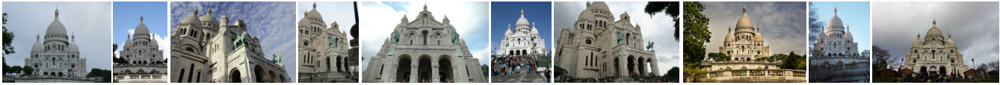

In [6]:
references = [str(p.relative_to(images)) for p in (images / 'mapping/').iterdir()]
print(len(references), "mapping images")
plot_images([read_image(images / r) for r in references], dpi=25)

Then we extract features and match them across image pairs. Since we deal with few images, we simply match all pairs exhaustively. For larger scenes, we would use image retrieval.

In [7]:
extract_features.main(feature_conf, images, image_list=references, feature_path=features)
pairs_from_exhaustive.main(sfm_pairs, image_list=references)
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches);

[2024/04/26 06:50:01 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
Downloading: "https://raw.githubusercontent.com/cvlab-epfl/disk/master/depth-save.pth" to /root/.cache/torch/hub/checkpoints/depth-save.pth
100%|██████████| 4.17M/4.17M [00:00<00:00, 31.8MB/s]
100%|██████████| 10/10 [02:09<00:00, 12.91s/it]
[2024/04/26 06:52:11 hloc INFO] Finished exporting features.
[2024/04/26 06:52:11 hloc INFO] Found 45 pairs.
[2024/04/26 06:52:11 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/disk_lightglue.pth" to /root/.cache/torch/hub/checkpoints/disk_lightglue_v0-1_arxiv.pth
100%|██████████| 45.4M/45.4M [00:00<00:00, 146MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/da

Running incremental structure from motion

In [8]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, features, matches, image_list=references)

[2024/04/26 07:22:12 hloc INFO] Creating an empty database...
[2024/04/26 07:22:12 hloc INFO] Importing images into the database...
[2024/04/26 07:22:12 hloc INFO] Importing features into the database...
100%|██████████| 10/10 [00:00<00:00, 592.17it/s]
[2024/04/26 07:22:12 hloc INFO] Importing matches into the database...
100%|██████████| 45/45 [00:00<00:00, 793.22it/s]
[2024/04/26 07:22:12 hloc INFO] Performing geometric verification of the matches...
[2024/04/26 07:22:25 hloc INFO] Running 3D reconstruction...
[2024/04/26 07:22:56 hloc INFO] Reconstructed 1 model(s).
[2024/04/26 07:22:56 hloc INFO] Largest model is #0 with 10 images.
[2024/04/26 07:22:56 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_reg_images = 10
	num_cameras = 10
	num_points3D = 5904
	num_observations = 31653
	mean_track_length = 5.36128
	mean_observations_per_image = 3165.3
	mean_reprojection_error = 0.844374
	num_input_images = 10


3D reconstructed model

In [9]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping", points_rgb=True)
fig.show()

visualizing the keypoints triangulated

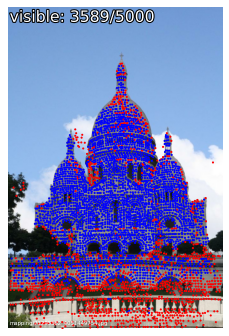

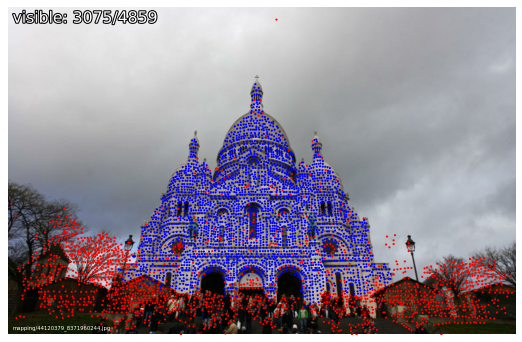

In [10]:
visualization.visualize_sfm_2d(model, images, color_by='visibility', n=2)

## Localization

since we have the 3d map, we can now localize any image of this monument

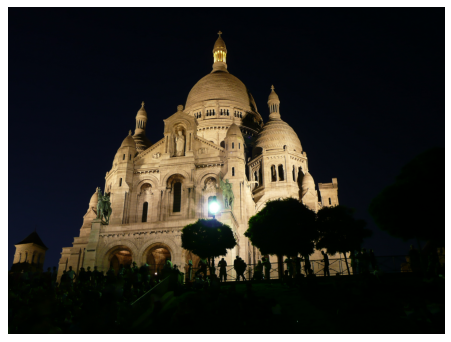

In [13]:
url = "https://upload.wikimedia.org/wikipedia/commons/5/53/Paris_-_Basilique_du_Sacr%C3%A9_Coeur%2C_Montmartre_-_panoramio.jpg"
query = 'query/night.jpg'
!mkdir -p $images/query && wget $url -O $images/$query -q
plot_images([read_image(images / query)], dpi=75)

Again, we extract features for the query and match them exhaustively with all mapping images that were successfully reconstructed.

In [14]:
references_registered = [model.images[i].name for i in model.reg_image_ids()]
extract_features.main(feature_conf, images, image_list=[query], feature_path=features, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references_registered)
match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True);

[2024/04/26 07:36:06 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
  0%|          | 0/1 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

100%|██████████| 1/1 [00:32<00:00, 32.89s/it]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

100%|██████████| 1/1 [00:32<00:00, 32.96s/it]
[2024/04/26 07:36:39 hloc INFO] Finished exporting features.
[2024/04/26 07:36:39 hloc INFO] Found 10 pairs.
[2024/04/26 07:36:39 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'}

We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

found 3121/4618 inlier correspondences.


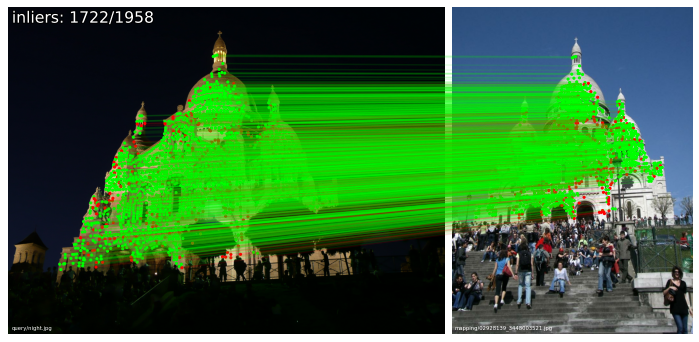

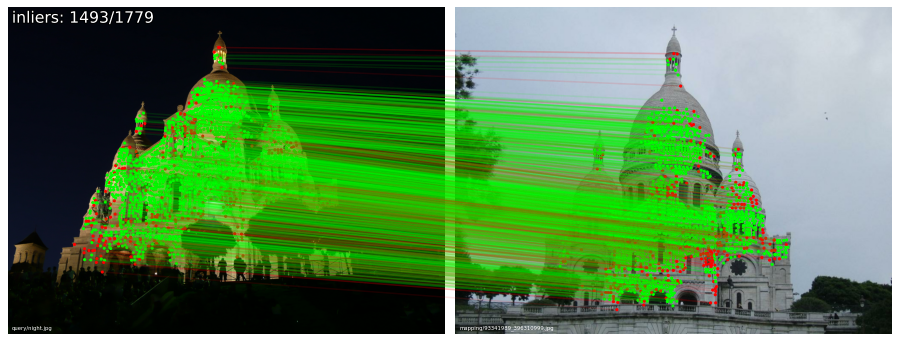

In [15]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(n).image_id for n in references_registered]
conf = {
    'estimation': {'ransac': {'max_error': 12}},
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model)

We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

In [16]:
pose = pycolmap.Image(cam_from_world=ret['cam_from_world'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query, fill=True)
# visualize 2D-3D correspodences
import numpy as np
inl_3d = np.array([model.points3D[pid].xyz for pid in np.array(log['points3D_ids'])[ret['inliers']]])
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

###Localization on another image of this monument

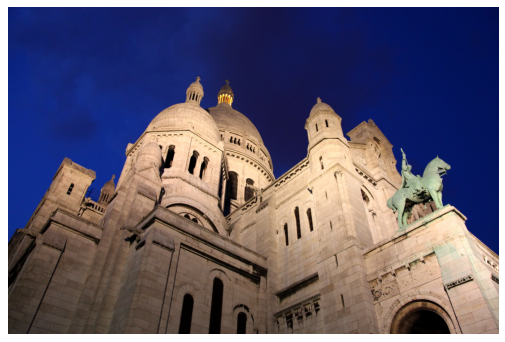

In [17]:
url = "https://upload.wikimedia.org/wikipedia/commons/8/8e/Sacr%C3%A9_C%C5%93ur_at_night%21_%285865355326%29.jpg"
query = 'query/night.jpg'
!mkdir -p $images/query && wget $url -O $images/$query -q
plot_images([read_image(images / query)], dpi=75)

In [18]:
references_registered = [model.images[i].name for i in model.reg_image_ids()]
extract_features.main(feature_conf, images, image_list=[query], feature_path=features, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references_registered)
match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True);

[2024/04/26 08:33:39 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
100%|██████████| 1/1 [00:34<00:00, 34.25s/it]
[2024/04/26 08:34:14 hloc INFO] Finished exporting features.
[2024/04/26 08:34:14 hloc INFO] Found 10 pairs.
[2024/04/26 08:34:14 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
100%|██████████| 10/10 [06:05<00:00, 36.57s/it]
[2024/04/26 08:40:20 hloc INFO] Finished exporting matches.


found 902/2396 inlier correspondences.


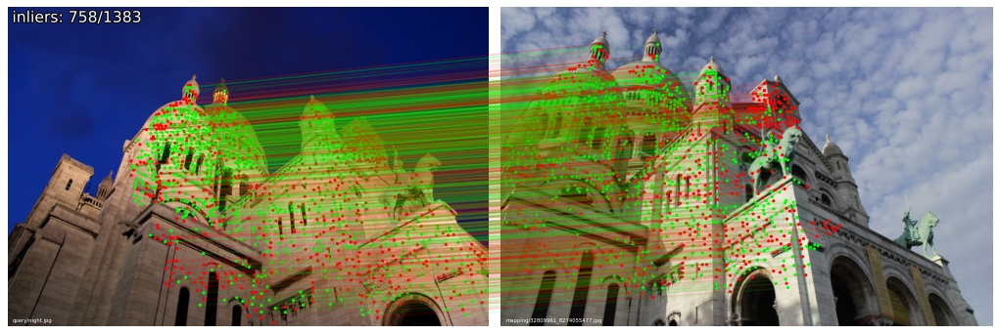

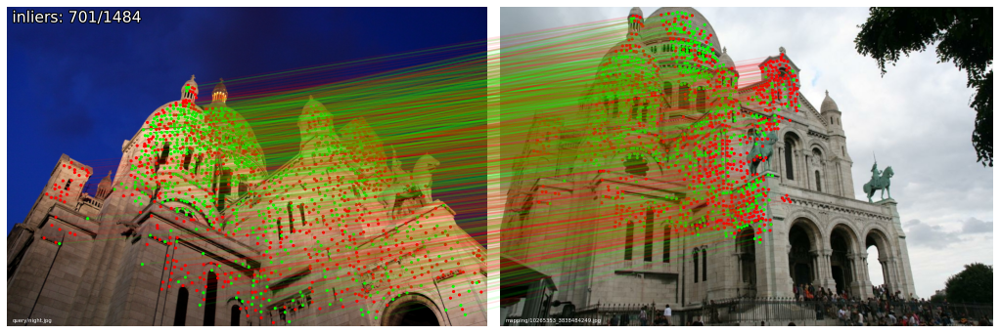

In [19]:
camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(n).image_id for n in references_registered]
conf = {
    'estimation': {'ransac': {'max_error': 12}},
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model)

In [20]:
pose = pycolmap.Image(cam_from_world=ret['cam_from_world'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query, fill=True)
# visualize 2D-3D correspodences
import numpy as np
inl_3d = np.array([model.points3D[pid].xyz for pid in np.array(log['points3D_ids'])[ret['inliers']]])
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

## Kaggle dataset - Images of a house

In [ ]:
pip install mediapy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.6 MB/s eta 0:00:00


In [ ]:
pip install pycolmap

In [ ]:
import os
import pycolmap
import numpy as np
import mediapy as media
import cv2
from glob import glob
from pathlib import Path
from time import time

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"mukulshingwani","key":"694dba979e9cc25eef7ca5b78fd5ed2f"}\n'}

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle competitions download -c image-matching-challenge-2023


100% 6.45G/6.45G [01:33<00:00, 133MB/s]
100% 6.45G/6.45G [01:33<00:00, 74.2MB/s]


In [ ]:
!unzip -q image-matching-challenge-2023.zip -d dataset


In [ ]:
dataset = 'urban'
scene = 'kyiv-puppet-theater'
src = f'dataset/train/{dataset}/{scene}'

images = [cv2.cvtColor(cv2.imread(im), cv2.COLOR_BGR2RGB) for im in glob(f'{src}/images/*')]



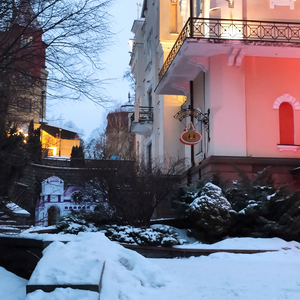
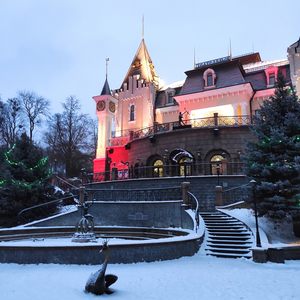
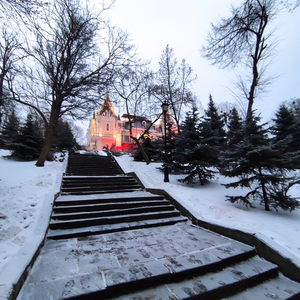
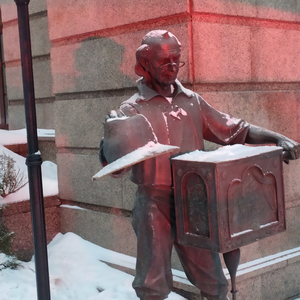
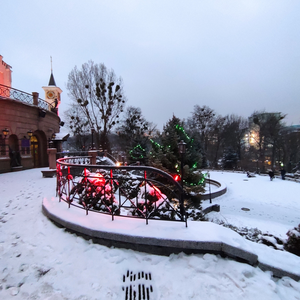
...
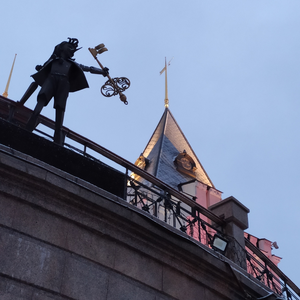
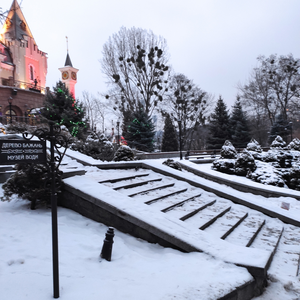
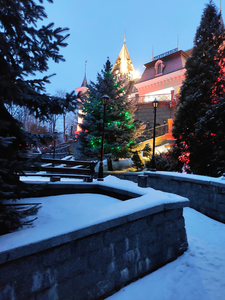
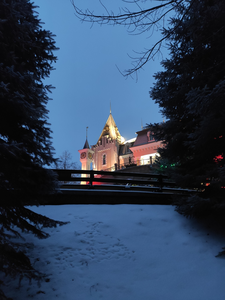
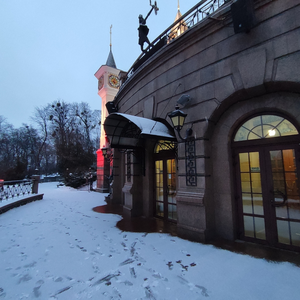

In [ ]:
media.show_images(images, height=300, columns=4)

In [ ]:
rec_gt = pycolmap.Reconstruction(f'{src}/sfm')

fig = viz_3d.init_figure()
viz_3d.plot_cameras(fig, rec_gt, color='rgba(50,255,50, 0.5)', name="Ground Truth", size=10)
viz_3d.plot_reconstruction(fig, rec_gt, cameras = False, color='rgba(255,50,255, 0.5)', name="Ground Truth", cs=5)
fig.show()